In [1]:
#%pip install git+https://github.com/zonca/pysm.git@debug_catalog

In [2]:
#%pip install pixell==0.26.0

In [3]:
import healpy as hp
import pysm3
from pysm3 import units as u
import pixell
from matplotlib import pyplot as plt
import numpy as np

In [4]:
from pixell.enplot import pshow, plot

In [5]:
nside = 64
sky = pysm3.Sky(nside, preset_strings=["d1"])

In [6]:
m = sky.get_emission(353*u.GHz)

In [7]:
gal2eq = hp.Rotator(coord=['G','E'])

In [9]:
m_healpix_smooth, m_car_smooth = pysm3.apply_smoothing_and_coord_transform(m, fwhm=5*u.deg, rot=gal2eq, return_car=True, output_car_resol=1*u.deg)

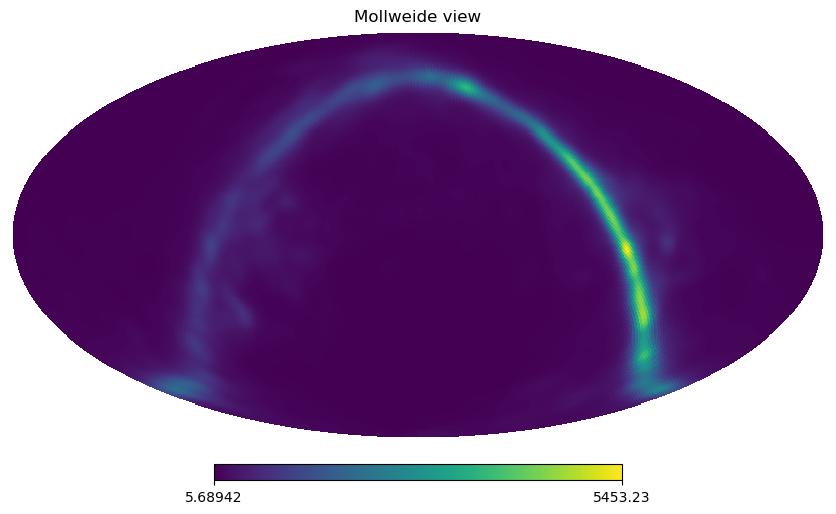

In [10]:
hp.mollview(m_healpix_smooth[0])

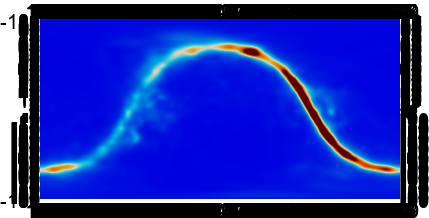

In [12]:
pshow(m_car_smooth[0])

In [19]:
sim = pixell.enmap.read_map("~/s/simonsobs/map_based_simulations/202208_galactic_foregrounds/dust_low/sobs_mbs-s0012-20230321_SAT_mission_f290_dust_low_car.fits")

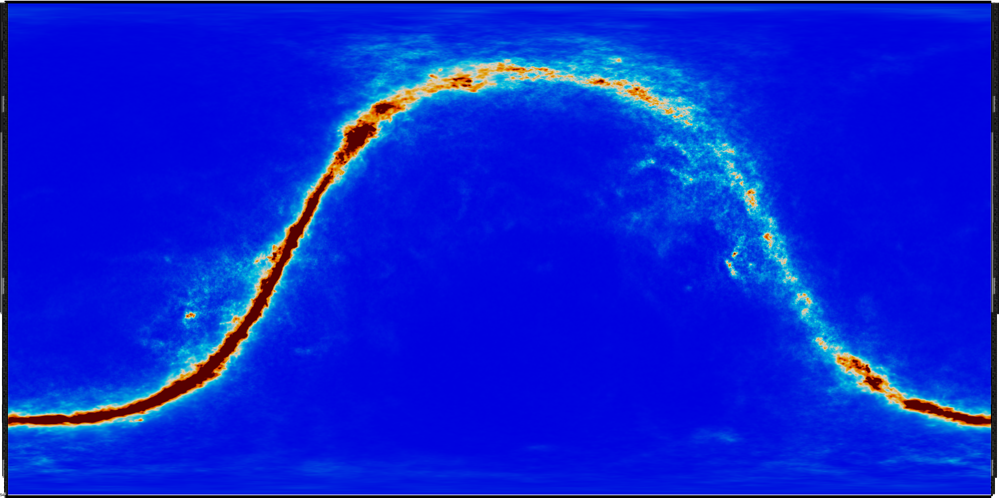

In [21]:
pshow(sim[0])

In [22]:
m_car_smooth.wcs

car:{cdelt:[-1,1],crval:[0.5,0],crpix:[180.50,90.50]}

In [23]:
sim.wcs

:{cdelt:[1,1],crval:[0,0],crpix:[0.00,0.00]}

In [25]:
shape, wcs = pixell.enmap.fullsky_geometry(
    output_car_resol.to_value(u.radian),
    dims=(3,),
    variant="fejer1",
)
pixell.enmap.write_map("dust_low_smoothed_with_wcs.fits", m_car_smooth)
pixell.enmap.write_map("dust_low_smoothed_no_wcs.fits", np.array(m_car_smooth))